# Inverse design of bimaterial LCE lattice: square (30x30)


## Imports

In [1]:
from morphing_lattices.optimization import ForwardProblem, OptimizationProblem
from morphing_lattices.structure import Lattice, ControlParams
from morphing_lattices.geometry import triangular_lattice_points, triangular_lattice_connectivity
from morphing_lattices.plotting import plot_lattice, generate_animation
from morphing_lattices.utils import save_data, load_data
import pandas as pd
import numpy as np
import jax.numpy as jnp
from jax._src.config import config
config.update("jax_enable_x64", True)  # enable float64 type
from pathlib import Path
import matplotlib.pyplot as plt
%matplotlib widget
plt.style.use(["science", "grid"])


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


## Import experimental material params


In [2]:
exp_actuation_strain = pd.read_csv(
    '../exp/mechanical_data/20230512_HTNI_LTNI_actuationstrains_highgranularityTemp3355.csv'
).drop(['Unnamed: 3'], axis=1)
exp_modulus_fine = pd.read_csv(
    '../exp/mechanical_data/youngs_mod_LCEstrips_DataForBertoldiGroup_updated202307.csv'
)
exp_modulus_fine.columns = [
    'Temp',
    'LTNI_avg_young',
    'LTNI_stdev',
    'HTNI_avg_young',
    'HTNI_stdev',
]
exp_modulus_fine.drop([0, 1], inplace=True)
exp_modulus_fine = exp_modulus_fine.reset_index(drop=True)

HTNI_stretch_data = exp_actuation_strain[
    ['temp [C]', 'AVG HTNI', 'STD HTNI']
].astype(float)
LTNI_stretch_data = exp_actuation_strain[
    ['temp [C]', 'AVG LTNI', 'STD LTNI']
].astype(float)
HTNI_modulus_data_fine = exp_modulus_fine[
    ['Temp', 'HTNI_avg_young']
].astype(float)
LTNI_modulus_data_fine = exp_modulus_fine[
    ['Temp', 'LTNI_avg_young']
].astype(float)


def HTNI_stretch(temperature):
    return jnp.interp(temperature, jnp.array(HTNI_stretch_data['temp [C]']), jnp.array(HTNI_stretch_data['AVG HTNI']))


def LTNI_stretch(temperature):
    return jnp.interp(temperature, jnp.array(LTNI_stretch_data['temp [C]']), jnp.array(LTNI_stretch_data['AVG LTNI']))


def HTNI_young_fit_fine(temperature):
    return jnp.interp(temperature, jnp.array(HTNI_modulus_data_fine['Temp']), jnp.array(HTNI_modulus_data_fine['HTNI_avg_young']))


def LTNI_young_fit_fine(temperature):
    return jnp.interp(temperature, jnp.array(LTNI_modulus_data_fine['Temp']), jnp.array(LTNI_modulus_data_fine['LTNI_avg_young']))

## Optimization problem

### Temperature evolution

In [3]:
sampled_temperatures = jnp.array([
    22, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125, 130
])

simulation_time = 9000.  # s
sampled_times = jnp.linspace(0, simulation_time, sampled_temperatures.shape[0])


def temperature_fn(t):
    return jnp.interp(t, sampled_times, sampled_temperatures)


def young_1_fn(t):
    return HTNI_young_fit_fine(temperature_fn(t))


def young_2_fn(t):
    return LTNI_young_fit_fine(temperature_fn(t))


def thermal_strain_1_fn(t):
    return (HTNI_stretch(temperature_fn(t))-1.)*0.8


def thermal_strain_2_fn(t):
    return (LTNI_stretch(temperature_fn(t))-1.)*0.7

### Forward problem

(<Figure size 500x500 with 1 Axes>, <Axes: title={'center': 'Lattice'}>)

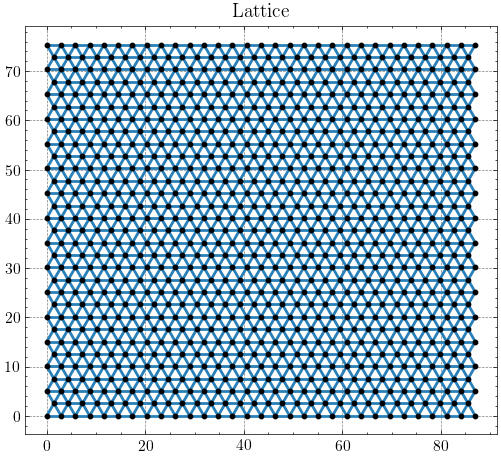

In [4]:
n1 = 30
n2 = 30
spacing = 2.9  # mm
points = triangular_lattice_points(n1=n1, n2=n2, spacing=spacing)
connectivity, horiz_bonds_even, horiz_bonds_odd, right_lean_even, right_lean_odd, left_lean_even, left_lean_odd = triangular_lattice_connectivity(
    n1=n1,
    n2=n2
)

n_points = points.shape[0]
n_bonds = connectivity.shape[0]

control_params = ControlParams(
    reference_points=points,  # mm
    young=jnp.ones(n_bonds),  # MPa
    area=jnp.ones(n_bonds)*(4*0.125**2),  # mm^2
    thermal_strain=-0.25*jnp.ones(n_bonds),
    damping=0.03*jnp.ones((n_points, 2)),
    masses=1.*jnp.ones((n_points, 2)),
    # NOTE: This is the initial guess for the material distribution
    # jnp.linspace(0, 1, n_bonds),  # NOTE: 0 means HTNI, 1 means LTNI
    phase=0.5*jnp.ones(n_bonds),
)
lattice = Lattice(
    connectivity=connectivity,
    control_params=control_params
)
problem = ForwardProblem(
    lattice=lattice,
    simulation_time=simulation_time,
    n_timepoints=sampled_temperatures.shape[0],
)
problem.setup(
    young_1_fn=young_1_fn,
    young_2_fn=young_2_fn,
    thermal_strain_1_fn=thermal_strain_1_fn,
    thermal_strain_2_fn=thermal_strain_2_fn,
    temperature_fn=temperature_fn,
)
plot_lattice(lattice=lattice, figsize=(5, 5), annotate=False, node_size=10)

## Circle to 4-pointed star


In [5]:
spikeness = 0.1
optimization_name = f"circle_4_pointed_star_spikeness_{spikeness:.2f}_n1_{n1}_n2_{n2}"


### Target points

In [6]:
# Select nodes on the boundary
bottom_edge_ids = jnp.arange(0, n1)[::2]
right_edge_ids = jnp.arange(n1, n_points-1, 2*n1+1)
top_edge_ids = jnp.arange(n_points-n1, n_points, 1)[::-1][::2]
left_edge_ids = jnp.arange(2*n1+1, n_points, 2*n1+1)[::-1]
target_points_ids = jnp.concatenate([
    bottom_edge_ids,
    right_edge_ids,
    top_edge_ids,
    left_edge_ids,
])

# Generate points on a circle starting from reference points
center = lattice.control_params.reference_points.mean(axis=0)
thetas = jnp.arctan2(lattice.control_params.reference_points[target_points_ids, 1]-center[1], lattice.control_params.reference_points[target_points_ids, 0]-center[0])
# thetas = jnp.linspace(thetas[0], thetas[0]+2*jnp.pi, thetas.shape[0])
target1_points= jnp.array([
    center[0] + n1*spacing/2*jnp.cos(thetas),
    center[1] + n1*spacing/2*jnp.sin(thetas)
]).T
# Generate a 4-pointed star
x_size = lattice.control_params.reference_points.max(axis=0)[0] - lattice.control_params.reference_points.min(axis=0)[0]
y_size = lattice.control_params.reference_points.max(axis=0)[1] - lattice.control_params.reference_points.min(axis=0)[1]
bottom_points = lattice.control_params.reference_points[bottom_edge_ids] + jnp.concatenate([
    jnp.linspace(0, 1, bottom_edge_ids.shape[0]//2+(n1//2)%2)[:, None]*jnp.array([0, 1]),
    jnp.linspace(1, 0, bottom_edge_ids.shape[0]//2)[:, None]*jnp.array([0, 1]),
], axis=0)*x_size*spikeness
right_points = lattice.control_params.reference_points[right_edge_ids] + jnp.concatenate([
    jnp.linspace(0, 1, right_edge_ids.shape[0]//2+1)[:, None]*jnp.array([-1, 0]),
    jnp.linspace(1, 0, right_edge_ids.shape[0]//2)[:, None]*jnp.array([-1, 0]),
], axis=0)*y_size*spikeness
top_points = lattice.control_params.reference_points[top_edge_ids] + jnp.concatenate([
    jnp.linspace(0, 1, top_edge_ids.shape[0]//2+(n1//2)%2)[:, None]*jnp.array([0, -1]),
    jnp.linspace(1, 0, top_edge_ids.shape[0]//2)[:, None]*jnp.array([0, -1]),
], axis=0)*x_size*spikeness
left_points = lattice.control_params.reference_points[left_edge_ids] + jnp.concatenate([
    jnp.linspace(0, 1, left_edge_ids.shape[0]//2+1)[:, None]*jnp.array([1, 0]),
    jnp.linspace(1, 0, left_edge_ids.shape[0]//2)[:, None]*jnp.array([1, 0]),
], axis=0)*y_size*spikeness
target2_points = jnp.concatenate([
    bottom_points,
    right_points,
    top_points,
    left_points,
], axis=0)


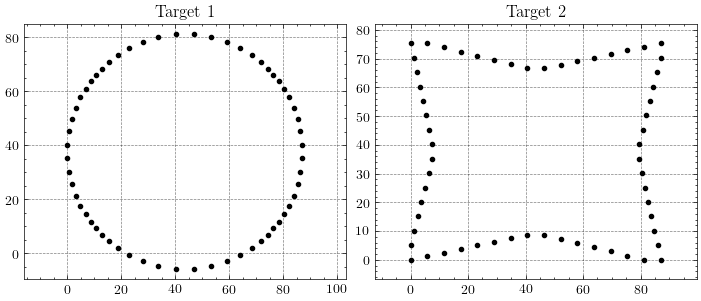

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 3), constrained_layout=True)
ax1.plot(target1_points[:, 0], target1_points[:, 1],
         'o', color='k', markersize=3)
ax2.plot(target2_points[:, 0], target2_points[:, 1],
         'o', color='k', markersize=3)
ax1.set_title('Target 1')
ax2.set_title('Target 2')
ax1.axis('equal')
ax2.axis('equal')

out_path = Path(f"{optimization_name}/target_shapes.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
plt.savefig(str(out_path), dpi=300)

### Run optimization


In [ ]:
optimization = OptimizationProblem(
    forward_problem=problem,
    target1_points=target1_points,
    target2_points=target2_points,
    target_points_ids=target_points_ids,
    target1_temperature=70.,
    target2_temperature=130.
)

In [ ]:
optimization.run_optimization_nlopt(
    n_iterations=50,
    lower_bound=0.,
    upper_bound=1.,
)
save_data(
    f"../data/inverse_design/{optimization_name}.pkl",
    optimization.to_data(),
)

Iteration: 1
Objective = 0.20216850057345653
MMA dual converged in 2 iterations to g=0.202168:
Iteration: 2
Objective = 0.20216758481286745
MMA outer iteration: rho -> 0.1
MMA dual converged in 2 iterations to g=0.202163:
Iteration: 3
Objective = 0.2021584334096996
MMA outer iteration: rho -> 0.01
                 MMA sigma[0] -> 0.6
MMA dual converged in 2 iterations to g=0.202093:
Iteration: 4
Objective = 0.202027387529295
MMA outer iteration: rho -> 0.001
                 MMA sigma[0] -> 0.72
MMA dual converged in 2 iterations to g=0.201149:
Iteration: 5
Objective = 0.2002350483742675
MMA outer iteration: rho -> 0.0001
                 MMA sigma[0] -> 0.864
MMA dual converged in 2 iterations to g=0.191992:
Iteration: 6
Objective = 0.17468281239749905
MMA outer iteration: rho -> 1e-05
                 MMA sigma[0] -> 1.0368
MMA dual converged in 2 iterations to g=0.134043:
Iteration: 7
Objective = 0.14060570106566875
MMA inner iteration: rho -> 4.77118e-05
MMA dual converged in 2 ite

### Sweep weights

In [ ]:
# # Sweep over weights: w_1: 1→0, w_2: 0→1
# n_weights = 5
# weights_sweep = jnp.array([
#     jnp.linspace(1, 0, n_weights),
#     jnp.linspace(0, 1, n_weights),
# ]).T
# for weights in weights_sweep:
#     optimization = OptimizationProblem(
#         forward_problem=problem,
#         target1_points=target1_points,
#         target2_points=target2_points,
#         target_points_ids=target_points_ids,
#         target1_temperature=70.,
#         target2_temperature=130.,
#         weights=weights
#     )
#     optimization.run_optimization_nlopt(
#         n_iterations=50,
#         lower_bound=0.,
#         upper_bound=1.,
#     )
#     # Save optimization data
#     save_data(
#         f"../data/inverse_design/{optimization_name}/pareto/weights_{weights[0]:.2f}_{weights[1]:.2f}.pkl",
#         optimization.to_data(),
#     )

### Pareto front

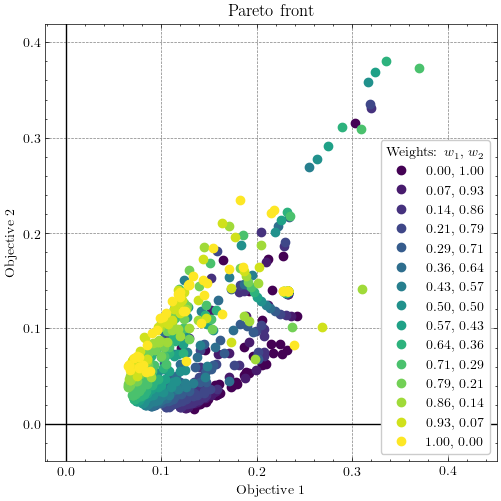

In [8]:
sweep_files = Path(
    f"../data/inverse_design/{optimization_name}/pareto/"
).glob("*.pkl")
# Sort by first weight
sweep_files = sorted(sweep_files, key=lambda x: float(x.stem.split('_')[-2]))
fig, axes = plt.subplots(figsize=(5, 5), constrained_layout=True)
# Use first weight for color
cmap = plt.get_cmap('viridis')
for file in sweep_files:
    opt = OptimizationProblem.from_data(load_data(file))
    axes.plot(
        opt.individual_objective_values[:, 0],
        opt.individual_objective_values[:, 1],
        'o',
        color=cmap(opt.weights[0]),
        label=f"{opt.weights[0]:.2f}, {opt.weights[1]:.2f}"
    )
axes.set_xlabel('Objective 1')
axes.set_ylabel('Objective 2')
axes.axhline(0, color='k')
axes.axvline(0, color='k')
axes.set_xlim(left=0)
axes.set_ylim(bottom=0)
axes.legend(title=r"Weights: $w_1,\, w_2$")
axes.set_title('Pareto front')
axes.axis('equal')
fig.savefig(
    f"{optimization_name}/pareto_front.png",
    dpi=300
)

### Output filenames and directories

In [9]:
weights = (0.79, 0.21)
optimization_data_file = f"{optimization_name}/pareto/weights_{weights[0]:.2f}_{weights[1]:.2f}"
# optimization_data_file = f"{optimization_name}"
out_folder_label = f"_best"
# out_folder_label = f""
out_folder = f"{optimization_data_file}{out_folder_label}"


### Best equi-peformance design


In [10]:
optimization = OptimizationProblem.from_data(
    load_data(f"../data/inverse_design/{optimization_data_file}.pkl")
)

### Plot the objective values

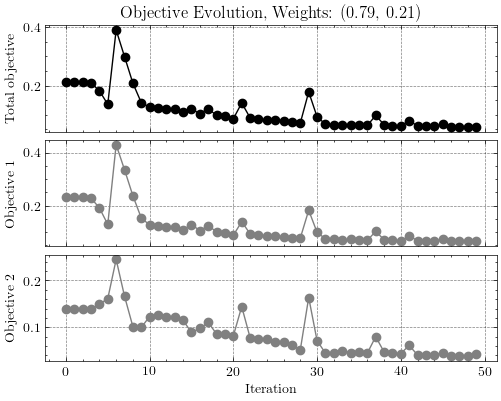

In [11]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(5, 4), sharex=True, constrained_layout=True)
axes[0].plot(optimization.objective_values, color='k', marker='o')
axes[0].set_title(f'Objective Evolution, Weights: ({optimization.weights[0]:.2f}, {optimization.weights[1]:.2f})')
axes[0].set_ylabel('Total objective')
axes[1].plot(optimization.individual_objective_values[:, 0], color='gray', marker='o')
axes[1].set_ylabel('Objective 1')
axes[2].plot(optimization.individual_objective_values[:, 1], color='gray', marker='o')
axes[2].set_ylabel('Objective 2')
axes[-1].set_xlabel('Iteration')
out_path = Path(f"{out_folder}/objective_value_evolution.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

### Plot deformed shapes (continuous phase)

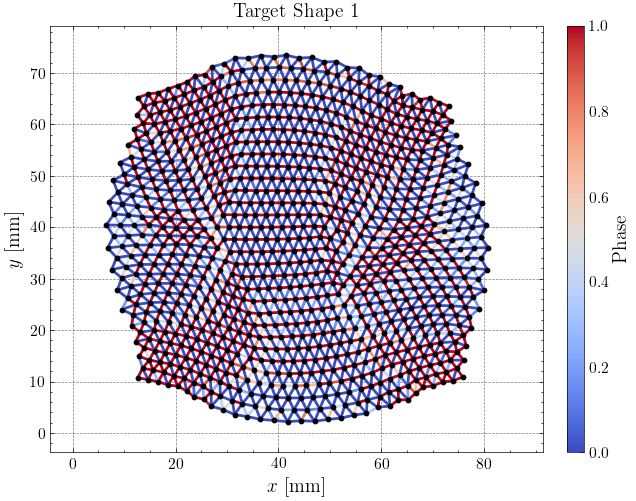

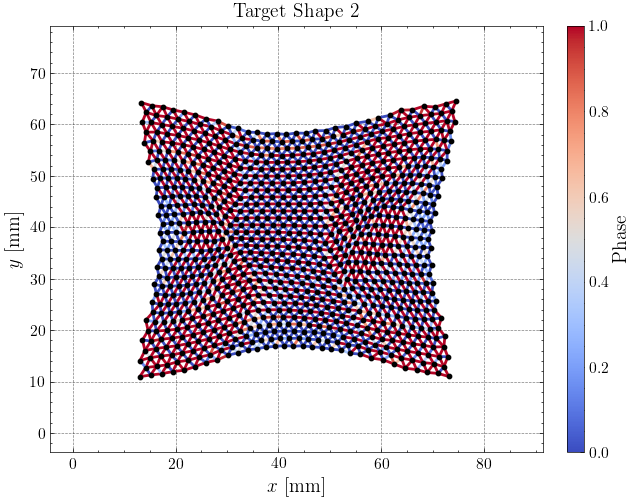

In [12]:
fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 1',
    displacement=optimization.best_response[10, 0],
    bond_values=optimization.best_control_params.phase,
    figsize=(7, 5),
    legend_label="Phase",
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/target_shape1_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 2',
    displacement=optimization.best_response[-1, 0],
    bond_values=optimization.best_control_params.phase,
    figsize=(7, 5),
    legend_label="Phase",
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/target_shape2_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

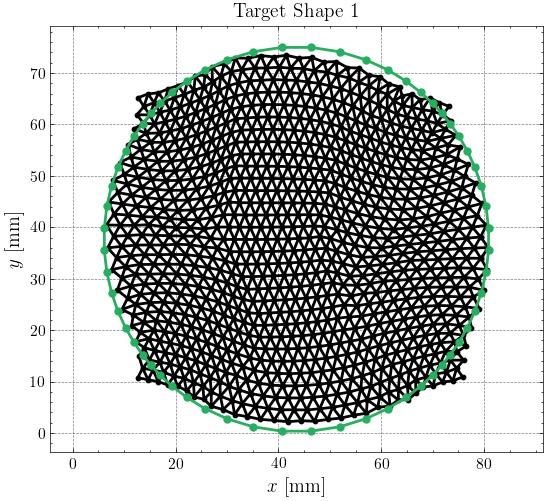

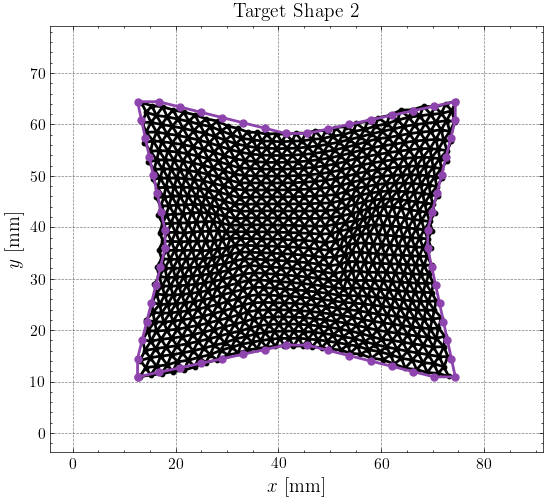

In [15]:
# Plot lattice and targets
target_scale_factors = (0.86, 0.71)
target_colors = ('#27ae60', '#8e44ad')
titles = ('Target Shape 1', 'Target Shape 2')
target_timepoints = (10, -1)

for (i, target_points), timepoint, scale, color, title in zip(enumerate((target1_points, target2_points)), target_timepoints, target_scale_factors, target_colors, titles):
    fig, axes = plot_lattice(
        lattice=lattice,
        title=title,
        displacement=optimization.best_response[timepoint, 0],
        # bond_values=optimization.best_control_params.phase,
        bond_color="black",
        figsize=(7, 5),
        node_size=10,
        x_label="$x$ [mm]",
        y_label="$y$ [mm]",
    )
    pts_center = target_points.mean(axis=0)
    target_scaled = scale*(target_points - pts_center) + pts_center
    target_scaled = jnp.concatenate([target_scaled, target_scaled[0, None]], axis=0) # To close the target shape
    axes.plot(*target_scaled.T, '-o', lw=2,
              color=color, markersize=5, zorder=20)
    # Make sure parents directories exist
    out_path = Path(f"{out_folder}/lattice_vs_target_shape_{i+1}.png")
    out_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(str(out_path), dpi=300)

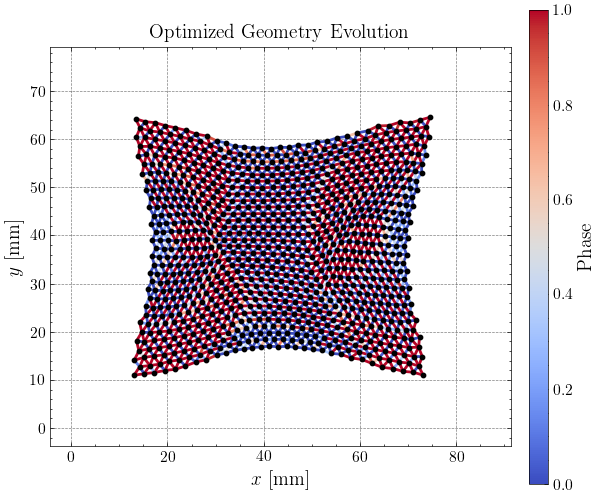

In [16]:
generate_animation(
    lattice=lattice,
    solution=optimization.best_response,
    out_filename=f'{out_folder}/animation',
    frame_range=optimization.best_response.shape[0],
    figsize=(6, 5),
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
    title=f'Optimized Geometry Evolution',
    node_size=10,
    bond_values=jnp.array(
        [optimization.best_control_params.phase]*optimization.best_response.shape[0]),
    legend_label="Phase",
    dpi=300,
)

### Impose Discrete Phase Values Corresponding to HTNI and LTNI LCE

In [17]:
phase_threshold = 0.5
discrete_phases = jnp.where(optimization.best_control_params.phase > phase_threshold, 1, 0)
# discrete_phases = jnp.where(optimization.design_values[-2] > phase_threshold, 1, 0)

discrete_phase_solution, discrete_control_params = problem.solve(discrete_phases)

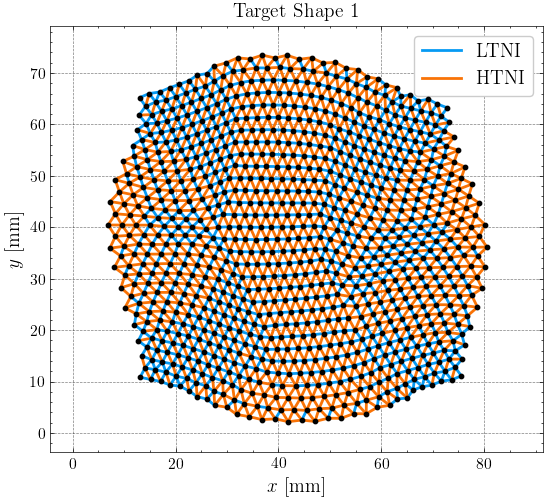

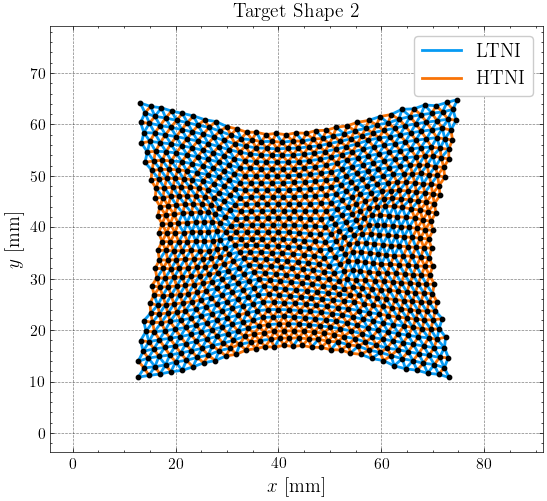

In [18]:
fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 1',
    displacement=discrete_phase_solution[10, 0],
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    figsize=(7, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/LCE_labeled_target_shape1_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 2',
    displacement=discrete_phase_solution[-1, 0],
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    figsize=(7, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/LCE_labeled_target_shape2_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

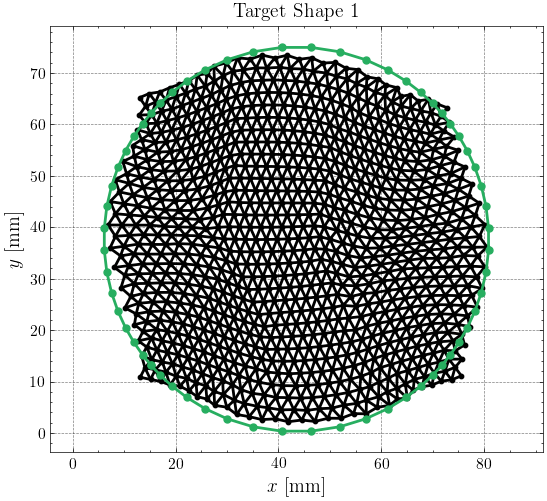

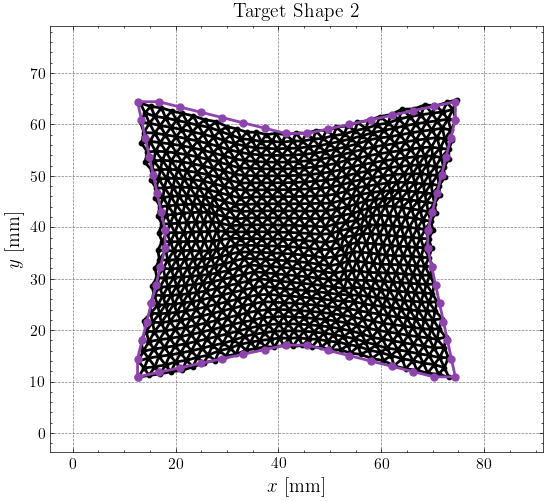

In [20]:
# Plot lattice and targets
target_scale_factors = (0.86, 0.71)
target_colors = ('#27ae60', '#8e44ad')
titles = ('Target Shape 1', 'Target Shape 2')
target_timepoints = (10, -1)

for (i, target_points), timepoint, scale, color, title in zip(enumerate((target1_points, target2_points)), target_timepoints, target_scale_factors, target_colors, titles):
    fig, axes = plot_lattice(
        lattice=lattice,
        title=title,
        displacement=discrete_phase_solution[timepoint, 0],
        bond_color="black",
        figsize=(7, 5),
        node_size=10,
        x_label="$x$ [mm]",
        y_label="$y$ [mm]",
    )
    pts_center = target_points.mean(axis=0)
    target_scaled = scale*(target_points - pts_center) + pts_center
    target_scaled = jnp.concatenate([target_scaled, target_scaled[0, None]], axis=0) # To close the target shape
    axes.plot(*target_scaled.T, '-o', lw=2,
              color=color, markersize=5, zorder=20)
    # Make sure parents directories exist
    out_path = Path(f"{out_folder}/lattice_vs_target_shape_discrete_{i+1}.png")
    out_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(str(out_path), dpi=300)

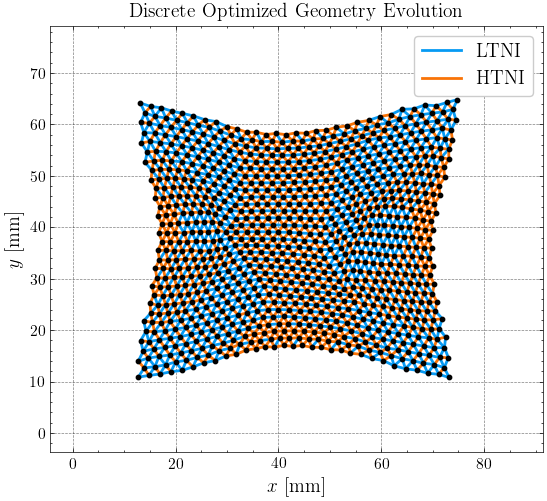

In [21]:
generate_animation(
    lattice=lattice,
    solution=discrete_phase_solution,
    out_filename=f'{out_folder}/discrete_animation',
    frame_range=discrete_phase_solution.shape[0],
    title=f'Discrete Optimized Geometry Evolution',
    figsize=(6, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    dpi=300,
)

## Curvy squares


In [22]:
spikeness = 0.1
optimization_name = f"curvy_square_spikeness_{spikeness:.2f}_n1_{n1}_n2_{n2}"


### Target points

In [23]:
# Select nodes on the boundary
bottom_edge_ids = jnp.arange(0, n1)[::2]
right_edge_ids = jnp.arange(n1, n_points-1, 2*n1+1)
top_edge_ids = jnp.arange(n_points-n1, n_points, 1)[::-1][::2]
left_edge_ids = jnp.arange(2*n1+1, n_points, 2*n1+1)[::-1]
target_points_ids = jnp.concatenate([
    bottom_edge_ids,
    right_edge_ids,
    top_edge_ids,
    left_edge_ids,
])

optimization_name = f"curvy_square_spikeness_{spikeness:.2f}_n1_{n1}_n2_{n2}"
# Generate a curvy square 1
x_size = lattice.control_params.reference_points.max(axis=0)[0] - lattice.control_params.reference_points.min(axis=0)[0]
y_size = lattice.control_params.reference_points.max(axis=0)[1] - lattice.control_params.reference_points.min(axis=0)[1]
bottom_points = lattice.control_params.reference_points[bottom_edge_ids] + jnp.array([
    jnp.zeros(bottom_edge_ids.shape[0]),
    -jnp.sin(jnp.linspace(0, 2*jnp.pi, bottom_edge_ids.shape[0])),
]).T*spikeness*x_size
right_points = lattice.control_params.reference_points[right_edge_ids] + jnp.array([
    jnp.sin(jnp.linspace(0, 2*jnp.pi, right_edge_ids.shape[0])),
    jnp.zeros(right_edge_ids.shape[0]),
]).T*spikeness*y_size
top_points = lattice.control_params.reference_points[top_edge_ids] + jnp.array([
    jnp.zeros(top_edge_ids.shape[0]),
    jnp.sin(jnp.linspace(0, 2*jnp.pi, top_edge_ids.shape[0])),
]).T*spikeness*x_size
left_points = lattice.control_params.reference_points[left_edge_ids] + jnp.array([
    -jnp.sin(jnp.linspace(0, 2*jnp.pi, left_edge_ids.shape[0])),
    jnp.zeros(left_edge_ids.shape[0]),
]).T*spikeness*y_size
target1_points = jnp.concatenate([
    bottom_points,
    right_points,
    top_points,
    left_points,
], axis=0)
# Generate a curvy square 2
x_size = lattice.control_params.reference_points.max(axis=0)[0] - lattice.control_params.reference_points.min(axis=0)[0]
y_size = lattice.control_params.reference_points.max(axis=0)[1] - lattice.control_params.reference_points.min(axis=0)[1]
bottom_points = lattice.control_params.reference_points[bottom_edge_ids] + jnp.array([
    jnp.zeros(bottom_edge_ids.shape[0]),
    jnp.sin(jnp.linspace(0, 2*jnp.pi, bottom_edge_ids.shape[0])),
]).T*spikeness*x_size
right_points = lattice.control_params.reference_points[right_edge_ids] + jnp.array([
    -jnp.sin(jnp.linspace(0, 2*jnp.pi, right_edge_ids.shape[0])),
    jnp.zeros(right_edge_ids.shape[0]),
]).T*spikeness*y_size
top_points = lattice.control_params.reference_points[top_edge_ids] + jnp.array([
    jnp.zeros(top_edge_ids.shape[0]),
    -jnp.sin(jnp.linspace(0, 2*jnp.pi, top_edge_ids.shape[0])),
]).T*spikeness*x_size
left_points = lattice.control_params.reference_points[left_edge_ids] + jnp.array([
    jnp.sin(jnp.linspace(0, 2*jnp.pi, left_edge_ids.shape[0])),
    jnp.zeros(left_edge_ids.shape[0]),
]).T*spikeness*y_size
target2_points = jnp.concatenate([
    bottom_points,
    right_points,
    top_points,
    left_points,
], axis=0)


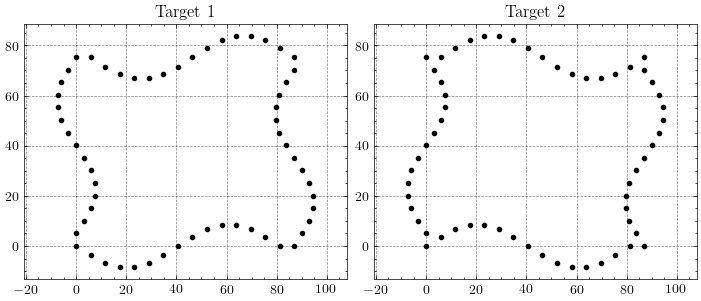

In [25]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 3), constrained_layout=True)
ax1.plot(target1_points[:, 0], target1_points[:, 1],
         'o', color='k', markersize=3)
ax2.plot(target2_points[:, 0], target2_points[:, 1],
         'o', color='k', markersize=3)
ax1.set_title('Target 1')
ax2.set_title('Target 2')
ax1.axis('equal')
ax2.axis('equal')

out_path = Path(f"{optimization_name}/target_shapes.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
plt.savefig(str(out_path), dpi=300)

### Run optimization


In [165]:
optimization = OptimizationProblem(
    forward_problem=problem,
    target1_points=target1_points,
    target2_points=target2_points,
    target_points_ids=target_points_ids,
    target1_temperature=70.,
    target2_temperature=130.
)

In [ ]:
optimization.run_optimization_nlopt(
    n_iterations=50,
    lower_bound=0.,
    upper_bound=1.,
)
save_data(
    f"../data/inverse_design/{optimization_name}.pkl",
    optimization.to_data(),
)

Iteration: 1
Objective = 0.20216850057345653
MMA dual converged in 2 iterations to g=0.202168:
Iteration: 2
Objective = 0.20216758481286745
MMA outer iteration: rho -> 0.1
MMA dual converged in 2 iterations to g=0.202163:
Iteration: 3
Objective = 0.2021584334096996
MMA outer iteration: rho -> 0.01
                 MMA sigma[0] -> 0.6
MMA dual converged in 2 iterations to g=0.202093:
Iteration: 4
Objective = 0.202027387529295
MMA outer iteration: rho -> 0.001
                 MMA sigma[0] -> 0.72
MMA dual converged in 2 iterations to g=0.201149:
Iteration: 5
Objective = 0.2002350483742675
MMA outer iteration: rho -> 0.0001
                 MMA sigma[0] -> 0.864
MMA dual converged in 2 iterations to g=0.191992:
Iteration: 6
Objective = 0.17468281239749905
MMA outer iteration: rho -> 1e-05
                 MMA sigma[0] -> 1.0368
MMA dual converged in 2 iterations to g=0.134043:
Iteration: 7
Objective = 0.14060570106566875
MMA inner iteration: rho -> 4.77118e-05
MMA dual converged in 2 ite

### Sweep weights

In [8]:
# # Sweep over weights: w_1: 1→0, w_2: 0→1
# n_weights = 5
# weights_sweep = jnp.array([
#     jnp.linspace(1, 0, n_weights),
#     jnp.linspace(0, 1, n_weights),
# ]).T
# for weights in weights_sweep:
#     optimization = OptimizationProblem(
#         forward_problem=problem,
#         target1_points=target1_points,
#         target2_points=target2_points,
#         target_points_ids=target_points_ids,
#         target1_temperature=70.,
#         target2_temperature=130.,
#         weights=weights
#     )
#     optimization.run_optimization_nlopt(
#         n_iterations=50,
#         lower_bound=0.,
#         upper_bound=1.,
#     )
#     # Save optimization data
#     save_data(
#         f"../data/inverse_design/{optimization_name}/pareto/weights_{weights[0]:.2f}_{weights[1]:.2f}.pkl",
#         optimization.to_data(),
#     )

### Pareto front

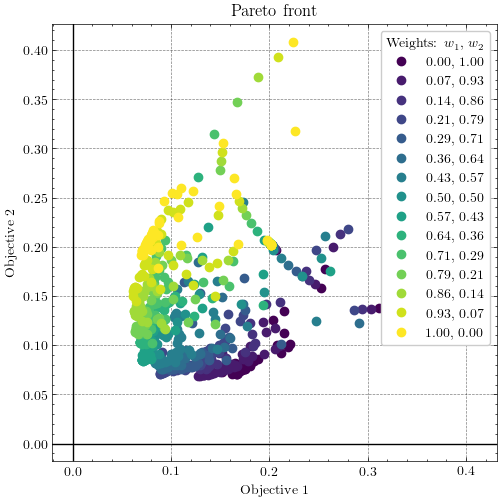

In [26]:
sweep_files = Path(
    f"../data/inverse_design/{optimization_name}/pareto/"
).glob("*.pkl")
# Sort by first weight
sweep_files = sorted(sweep_files, key=lambda x: float(x.stem.split('_')[-2]))
fig, axes = plt.subplots(figsize=(5, 5), constrained_layout=True)
# Use first weight for color
cmap = plt.get_cmap('viridis')
for file in sweep_files:
    opt = OptimizationProblem.from_data(load_data(file))
    axes.plot(
        opt.individual_objective_values[:, 0],
        opt.individual_objective_values[:, 1],
        'o',
        color=cmap(opt.weights[0]),
        label=f"{opt.weights[0]:.2f}, {opt.weights[1]:.2f}"
    )
axes.set_xlabel('Objective 1')
axes.set_ylabel('Objective 2')
axes.axhline(0, color='k')
axes.axvline(0, color='k')
axes.set_xlim(left=0)
axes.set_ylim(bottom=0)
axes.legend(title=r"Weights: $w_1,\, w_2$")
axes.set_title('Pareto front')
axes.axis('equal')
fig.savefig(
    f"{optimization_name}/pareto_front.png",
    dpi=300
)

### Output filenames and directories

In [27]:
weights = (0.57, 0.43)
optimization_data_file = f"{optimization_name}/pareto/weights_{weights[0]:.2f}_{weights[1]:.2f}"
# optimization_data_file = f"{optimization_name}"
out_folder_label = f"_best"
# out_folder_label = f""
out_folder = f"{optimization_data_file}{out_folder_label}"


### Best equi-peformance design


In [28]:
optimization = OptimizationProblem.from_data(
    load_data(f"../data/inverse_design/{optimization_data_file}.pkl")
)

### Plot the objective values

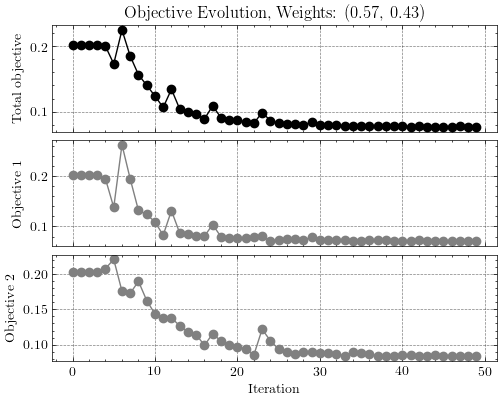

In [29]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(5, 4), sharex=True, constrained_layout=True)
axes[0].plot(optimization.objective_values, color='k', marker='o')
axes[0].set_title(f'Objective Evolution, Weights: ({optimization.weights[0]:.2f}, {optimization.weights[1]:.2f})')
axes[0].set_ylabel('Total objective')
axes[1].plot(optimization.individual_objective_values[:, 0], color='gray', marker='o')
axes[1].set_ylabel('Objective 1')
axes[2].plot(optimization.individual_objective_values[:, 1], color='gray', marker='o')
axes[2].set_ylabel('Objective 2')
axes[-1].set_xlabel('Iteration')
out_path = Path(f"{out_folder}/objective_value_evolution.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

### Plot deformed shapes (continuous phase)

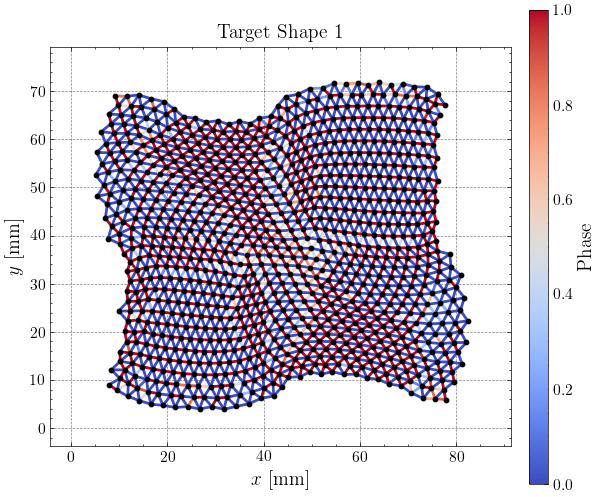

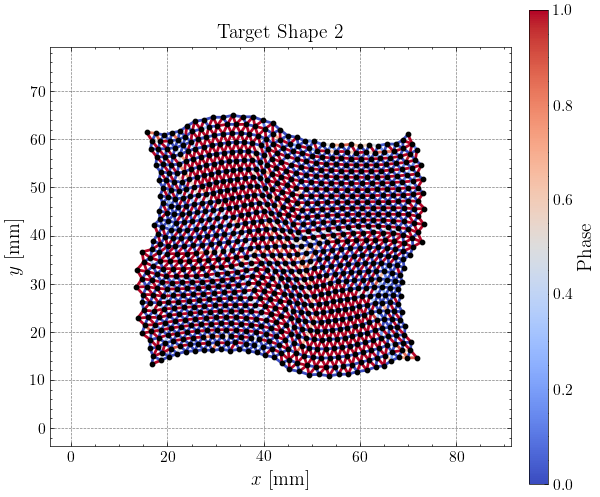

In [30]:
fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 1',
    displacement=optimization.best_response[10, 0],
    bond_values=optimization.best_control_params.phase,
    figsize=(6, 5),
    legend_label="Phase",
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/target_shape1_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 2',
    displacement=optimization.best_response[-1, 0],
    bond_values=optimization.best_control_params.phase,
    figsize=(6, 5),
    legend_label="Phase",
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/target_shape2_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

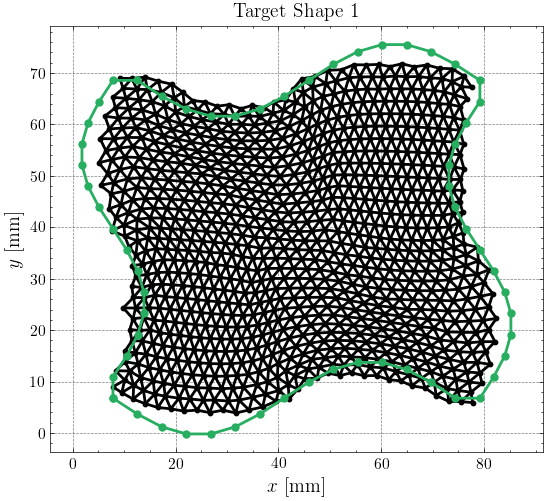

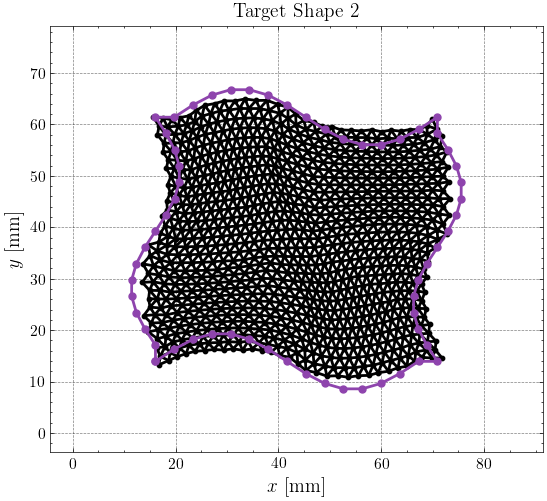

In [31]:
# Plot lattice and targets
target_scale_factors = (0.82, 0.63)
target_colors = ('#27ae60', '#8e44ad')
titles = ('Target Shape 1', 'Target Shape 2')
target_timepoints = (10, -1)

for (i, target_points), timepoint, scale, color, title in zip(enumerate((target1_points, target2_points)), target_timepoints, target_scale_factors, target_colors, titles):
    fig, axes = plot_lattice(
        lattice=lattice,
        title=title,
        displacement=optimization.best_response[timepoint, 0],
        # bond_values=optimization.best_control_params.phase,
        bond_color="black",
        figsize=(6, 5),
        node_size=10,
        x_label="$x$ [mm]",
        y_label="$y$ [mm]",
    )
    pts_center = target_points.mean(axis=0)
    target_scaled = scale*(target_points - pts_center) + pts_center
    target_scaled = jnp.concatenate([target_scaled, target_scaled[0, None]], axis=0) # To close the target shape
    axes.plot(*target_scaled.T, '-o', lw=2,
              color=color, markersize=5, zorder=20)
    # Make sure parents directories exist
    out_path = Path(f"{out_folder}/lattice_vs_target_shape_{i+1}.png")
    out_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(str(out_path), dpi=300)

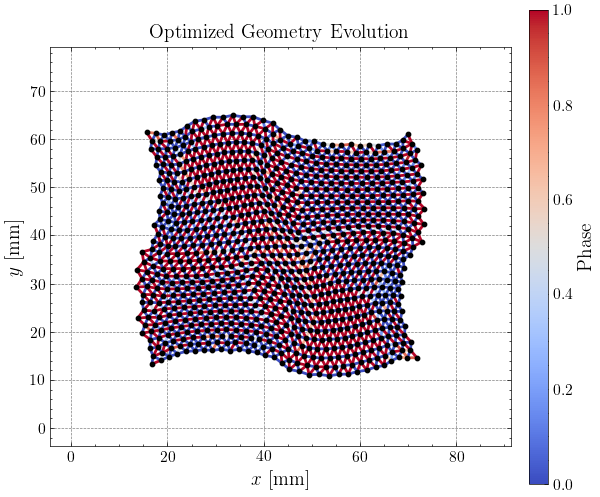

In [32]:
generate_animation(
    lattice=lattice,
    solution=optimization.best_response,
    out_filename=f'{out_folder}/animation',
    frame_range=optimization.best_response.shape[0],
    figsize=(6, 5),
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
    title=f'Optimized Geometry Evolution',
    node_size=10,
    bond_values=jnp.array(
        [optimization.best_control_params.phase]*optimization.best_response.shape[0]),
    legend_label="Phase",
    dpi=300,
)

### Impose Discrete Phase Values Corresponding to HTNI and LTNI LCE

In [33]:
phase_threshold = 0.5
discrete_phases = jnp.where(optimization.best_control_params.phase > phase_threshold, 1, 0)
# discrete_phases = jnp.where(optimization.design_values[-2] > phase_threshold, 1, 0)

discrete_phase_solution, discrete_control_params = problem.solve(discrete_phases)

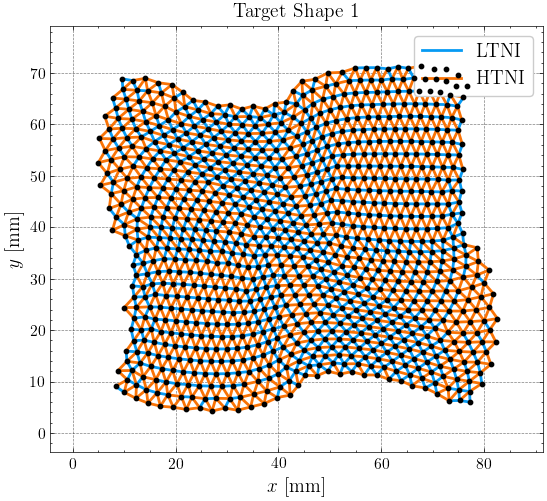

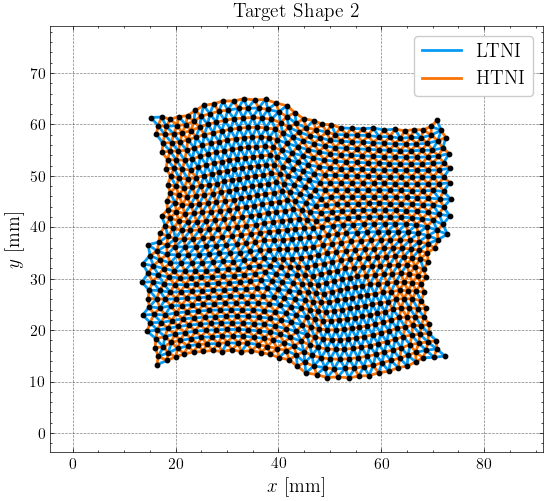

In [34]:
fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 1',
    displacement=discrete_phase_solution[10, 0],
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    figsize=(6, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/LCE_labeled_target_shape1_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

fig, axes = plot_lattice(
    lattice=lattice,
    title='Target Shape 2',
    displacement=discrete_phase_solution[-1, 0],
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    figsize=(6, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
)
out_path = Path(f"{out_folder}/LCE_labeled_target_shape2_phase_vals.png")
# Make sure parents directories exist
out_path.parent.mkdir(parents=True, exist_ok=True)
fig.savefig(str(out_path), dpi=300)

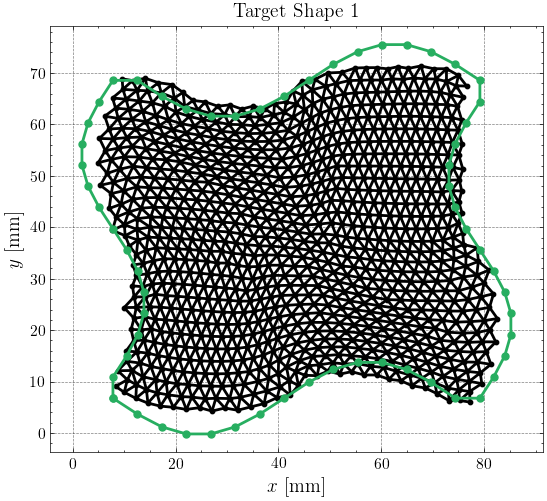

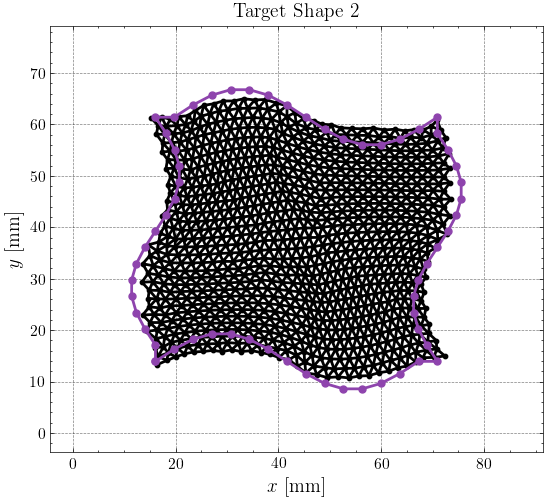

In [35]:
# Plot lattice and targets
target_scale_factors = (0.82, 0.63)
target_colors = ('#27ae60', '#8e44ad')
titles = ('Target Shape 1', 'Target Shape 2')
target_timepoints = (10, -1)

for (i, target_points), timepoint, scale, color, title in zip(enumerate((target1_points, target2_points)), target_timepoints, target_scale_factors, target_colors, titles):
    fig, axes = plot_lattice(
        lattice=lattice,
        title=title,
        displacement=discrete_phase_solution[timepoint, 0],
        bond_color="black",
        figsize=(6, 5),
        node_size=10,
        x_label="$x$ [mm]",
        y_label="$y$ [mm]",
    )
    pts_center = target_points.mean(axis=0)
    target_scaled = scale*(target_points - pts_center) + pts_center
    target_scaled = jnp.concatenate([target_scaled, target_scaled[0, None]], axis=0) # To close the target shape
    axes.plot(*target_scaled.T, '-o', lw=2,
              color=color, markersize=5, zorder=20)
    # Make sure parents directories exist
    out_path = Path(f"{out_folder}/lattice_vs_target_shape_discrete_{i+1}.png")
    out_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(str(out_path), dpi=300)

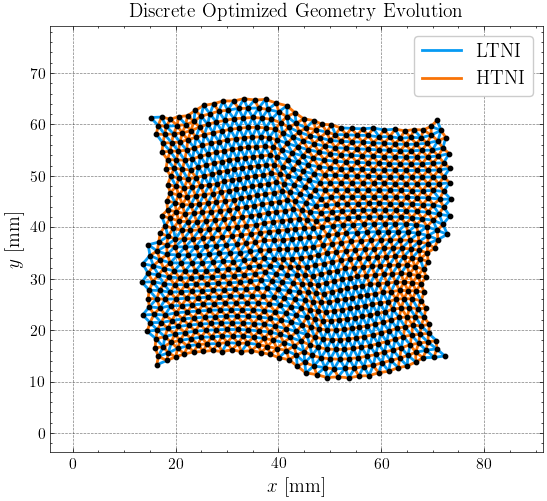

In [36]:
generate_animation(
    lattice=lattice,
    solution=discrete_phase_solution,
    out_filename=f'{out_folder}/discrete_animation',
    frame_range=discrete_phase_solution.shape[0],
    title=f'Discrete Optimized Geometry Evolution',
    figsize=(6, 5),
    node_size=10,
    x_label="$x$ [mm]",
    y_label="$y$ [mm]",
    bond_color=np.where(discrete_phases > phase_threshold,
                        "#069AF3", "#F97306"),
    legend_colors=("#069AF3", "#F97306"),
    legend_labels=("LTNI", "HTNI"),
    dpi=300,
)